In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['image.cmap'] = 'gray'

# Problem 1: Two-dimensional convolution.

## part - (a)

Note: The question is answered by using a number of helper/main functions written from scratch.
 - padding functions
 - convolution function
 - filter functions

In [2]:
# loading helper functions from function.py
from function import *

###### filters

In [3]:
# box filter
box = np.array([[1/9,1/9,1/9], [1/9,1/9,1/9], [1/9,1/9,1/9]])

# Prewitt filters
prewitt_x = np.array([[-1,0,1], [-1,0,1], [-1,0,1]])
prewitt_y = np.array([[1,1,1], [0,0,0], [-1,-1,-1]])

# Sobel filters
sobel_x = np.array([[-1,0,1], [-2,0,2], [-1,0,1]])
sobel_y = np.array([[1,2,1], [0,0,0], [-1,-2,-1]])

# Roberts filters
roberts_x = np.array([[0,1], [-1,0]])
roberts_y = np.array([[1,0], [0,-1]])

# first order derivative filter:
first_deriv_f1 = np.array([[-1,1]])
first_deriv_f2 = np.array([[-1],[1]])

In [4]:
# read lena.png
coloredImgLena, greyImgLena = load_image('lena.png')
# read wolve.png
coloredImgWolve, greyImgWolve = load_image('wolves.png')

In [5]:
def conv2(f, w, pdding_size = 2, pad=None):
    '''
    inputs: <2d array,  2d array, int>
    f, input_image : 2 dimentional array
    w, kernel_size: 2 dimentional array
    pdding_size, padd_kernel_size: <int> <an extra parameter>
    pad, padding: <string> 
        default: None
        'zero': zero padding
        'wrap': wrap around padding
        'edge': copy edge padding
        'reflect': reflect across edge
    outputs: <2d array>
    
    '''
    # get number of convolution required
    # given the image size and kernel size
    noOfConv_row = compute_kernel_iter(f.shape[0],w.shape[0])
    noOfConv_col = compute_kernel_iter(f.shape[1],w.shape[1])
    k = w.shape[0]
    # padding width per side
    pad_size = pdding_size//2
    paddedImg = 0
        
    if len(f.shape) < 3: # gray image
        
        if pad != None:
            if pad == 'zero':
                paddedImg = np.zeros(shape=( f.shape[0] + pad_size * 2,  
                f.shape[1] + pad_size * 2 ))
                paddedImg[pad_size:-pad_size, pad_size:-pad_size] = f
            elif pad == 'wrap':
                paddedImg = wrap_padding(f, pad_size)
            elif pad == 'edge':
                paddedImg = edge_padding(f, pad_size)
            elif pad == 'reflect':
                paddedImg = reflect_padding(f, pad_size)
                
            f = paddedImg.copy()

        # 2D array of zeros
        convolvedImg = np.zeros(shape=(noOfConv_row, noOfConv_col))

        # iterate kernel by each of the row 
        for rIdx in range(noOfConv_row):
            # Iterate over the columns
            for cIdx in range(noOfConv_col):
                # Get the current matrix equivalent to the kernel size
                mat = f[rIdx:rIdx+k, cIdx:cIdx+k]

                # Apply the convolution - element-wise multiplication & summation of the result
                # Store the result to i-th row and j-th column of our convolvedImg array
                convolvedImg[rIdx, cIdx] = np.sum(np.multiply(mat, w))
    else: # R, G, B Image        
        # 2D array of zeros
        convolvedImg = np.zeros(shape=(noOfConv_row, noOfConv_col, 3))
        
        if pad != None:
            paddedImg = np.zeros(shape=( f.shape[0] + pad_size * 2,
                                        f.shape[1] + pad_size * 2 , 3)) 
            if pad == 'zero':
                paddedImg[:,:,0][pad_size:-pad_size, pad_size:-pad_size] = f[:,:,0]
                paddedImg[:,:,1][pad_size:-pad_size, pad_size:-pad_size] = f[:,:,1]
                paddedImg[:,:,2][pad_size:-pad_size, pad_size:-pad_size] = f[:,:,2]
            elif pad == 'wrap':
                paddedImg[:,:,0] =                 wrap_padding(f[:,:,0], pad_size)
                paddedImg[:,:,1] =                 wrap_padding(f[:,:,1], pad_size)
                paddedImg[:,:,2] =                 wrap_padding(f[:,:,2], pad_size)
            elif pad == 'edge':
                paddedImg[:,:,0] =                 edge_padding(f[:,:,0], pad_size)
                paddedImg[:,:,1] =                 edge_padding(f[:,:,1], pad_size)
                paddedImg[:,:,2] =                 edge_padding(f[:,:,2], pad_size)
            elif pad == 'reflect':
                paddedImg[:,:,0] =                 reflect_padding(f[:,:,0], pad_size)
                paddedImg[:,:,1] =                 reflect_padding(f[:,:,1], pad_size)
                paddedImg[:,:,2] =                 reflect_padding(f[:,:,2], pad_size)
            
            f = paddedImg.copy()
            
        for rIdx in range(noOfConv_row):
            for cIdx in range(noOfConv_col):
                convolvedImg[rIdx, cIdx, 0] = np.sum(
                    np.multiply(f[:,:,0][rIdx:rIdx+k, cIdx:cIdx+k], w))
                convolvedImg[rIdx, cIdx, 1] = np.sum(
                    np.multiply(f[:,:,1][rIdx:rIdx+k, cIdx:cIdx+k], w))
                convolvedImg[rIdx, cIdx, 2] = np.sum(
                    np.multiply(f[:,:,2][rIdx:rIdx+k, cIdx:cIdx+k], w))

    if isinstance(paddedImg, int):
        return convolvedImg
    else:
        return convolvedImg, paddedImg

## Results:

## Padding Examples : using Sobel_X filter

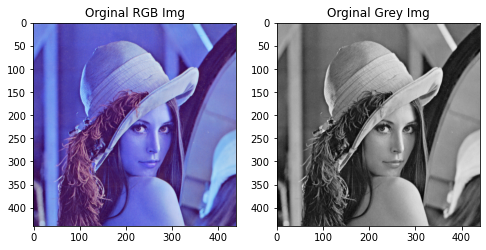

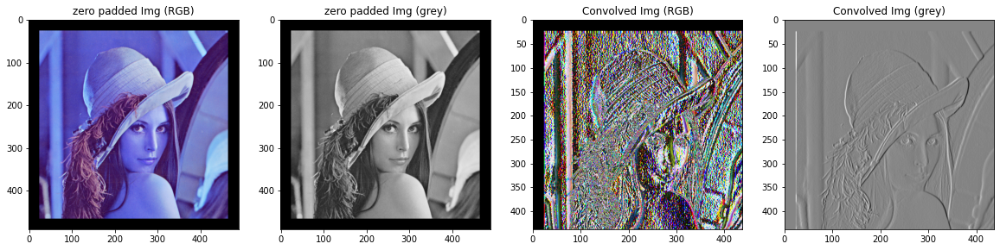

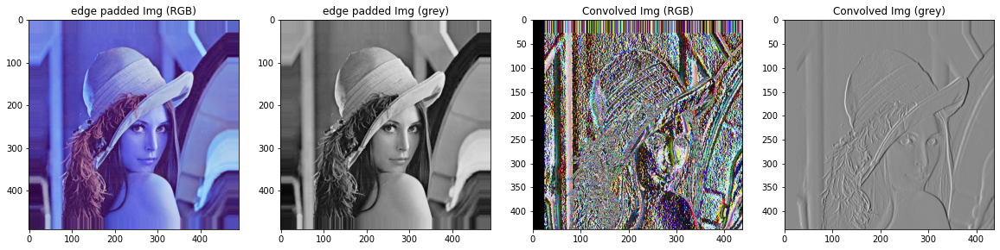

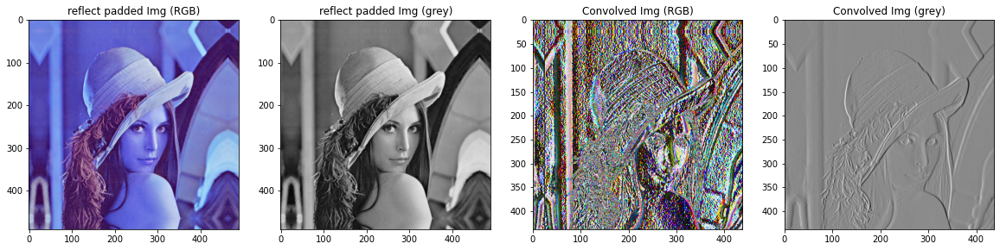

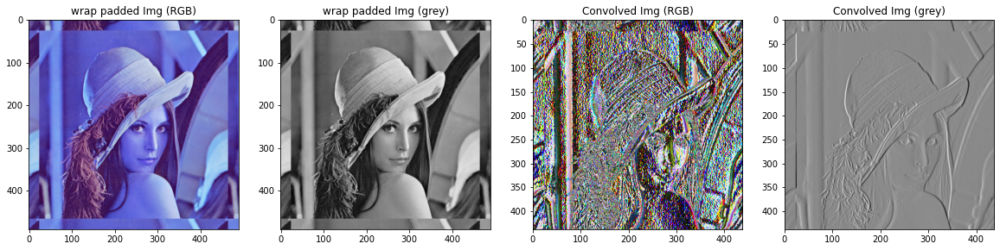

In [6]:
######### Example: Convolution with padded image 'Lena.png'
use_filter = sobel_x.copy()
padding_types = ['zero','edge','reflect','wrap']

titleName = ['Orginal RGB Img', 'Orginal Grey Img']
display_images(coloredImgLena, greyImgLena, title=titleName, flag=0)

for pad_type in padding_types:
    pks,ptype = 50, pad_type # padding kernel size, padding type
    convImg_c, pad_convImg_c = conv2(coloredImgLena, use_filter,
                                     pdding_size=pks ,pad=ptype)
    convImg_g, pad_convImg_g = conv2(greyImgLena, use_filter,
                                     pdding_size=pks, pad=ptype)

    titleName = ['{} padded Img (RGB)'.format(pad_type),
                 '{} padded Img (grey)'.format(pad_type),
                 'Convolved Img (RGB)','Convolved Img (grey)']
    display_images(pad_convImg_c, pad_convImg_g, convImg_c,
                   convImg_g, title=titleName, flag=2)

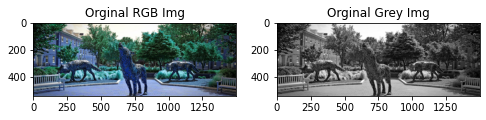

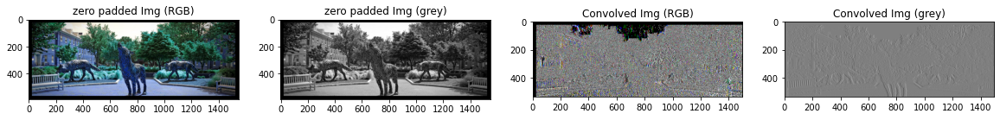

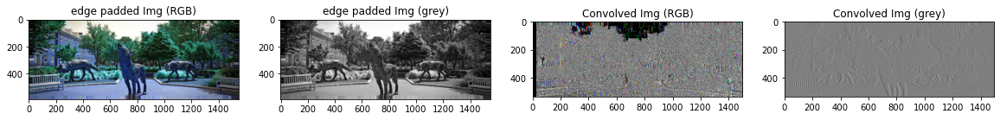

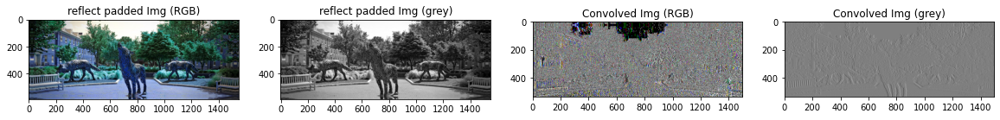

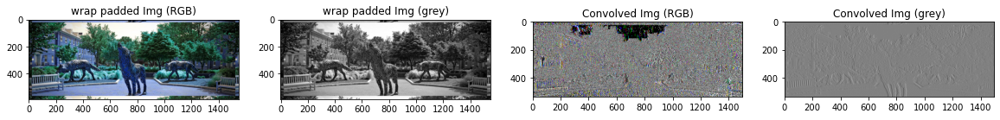

In [7]:
######### Example: Convolution with padded image 'wolves.png'
use_filter = sobel_x.copy()
padding_types = ['zero','edge','reflect','wrap']

titleName = ['Orginal RGB Img', 'Orginal Grey Img']
display_images(coloredImgWolve, greyImgWolve, title=titleName, flag=0)

for pad_type in padding_types:
    pks,ptype = 50, pad_type # padding kernel size, padding type
    convImg_c, pad_convImg_c = conv2(coloredImgWolve, use_filter,
                                     pdding_size=pks, pad=ptype)
    convImg_g, pad_convImg_g = conv2(greyImgWolve, use_filter,
                                     pdding_size=pks, pad=ptype)

    titleName = ['{} padded Img (RGB)'.format(pad_type),
                 '{} padded Img (grey)'.format(pad_type),
                 'Convolved Img (RGB)','Convolved Img (grey)']
    display_images(pad_convImg_c, pad_convImg_g, convImg_c,
                   convImg_g, title=titleName, flag=2)

## Below examples are to compare convolution with various filter without padding

### Convolution Comparison: Colored Image vs. Gray Image using Sobel_X filter

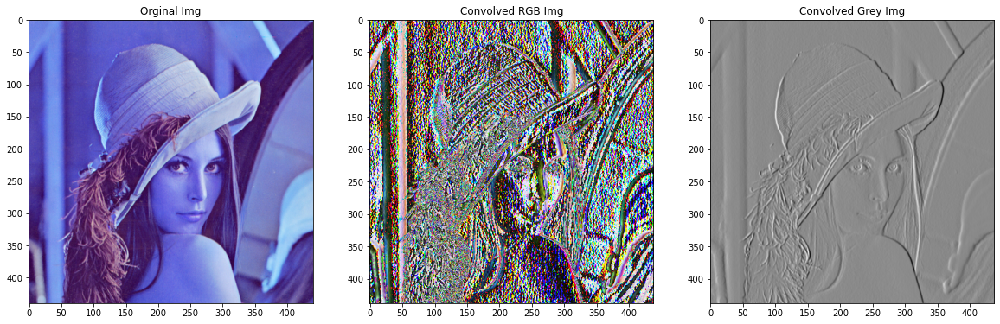

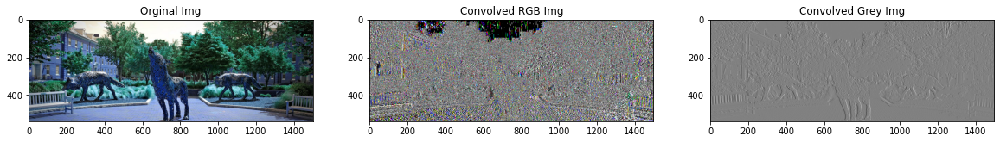

In [8]:
# convolution on 'Lena' coloredImage
use_filter = sobel_x.copy()
convImg_c = conv2(coloredImgLena, use_filter)
convImg_g = conv2(greyImgLena, use_filter)

titleName = ['Orginal Img','Convolved RGB Img', 'Convolved Grey Img']
display_images(coloredImgLena, convImg_c, convImg_g, title=titleName, flag=1)

# convolution on 'Wolve' coloredImage
convImg_c = conv2(coloredImgWolve, use_filter)
convImg_g = conv2(greyImgWolve, use_filter)
display_images(coloredImgWolve, convImg_c, convImg_g, title=titleName, flag=1)

### Colored Image vs. Gray Image [Sobel_y ]

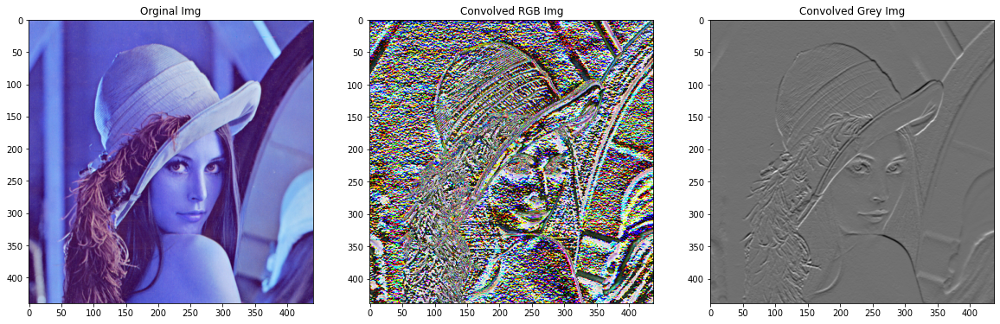

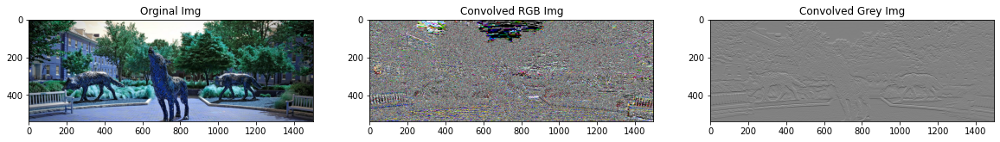

In [9]:
# convolution on 'Lena' coloredImage
use_filter = sobel_y.copy()
convImg_c = conv2(coloredImgLena, use_filter)
convImg_g = conv2(greyImgLena, use_filter)
display_images(coloredImgLena, convImg_c, convImg_g, title=titleName, flag=1)

# convolution on 'Wolve' coloredImage
convImg_c = conv2(coloredImgWolve, use_filter)
convImg_g = conv2(greyImgWolve, use_filter)
display_images(coloredImgWolve, convImg_c, convImg_g, title=titleName, flag=1)

### Colored Image vs. Gray Image [prewitt_x ]

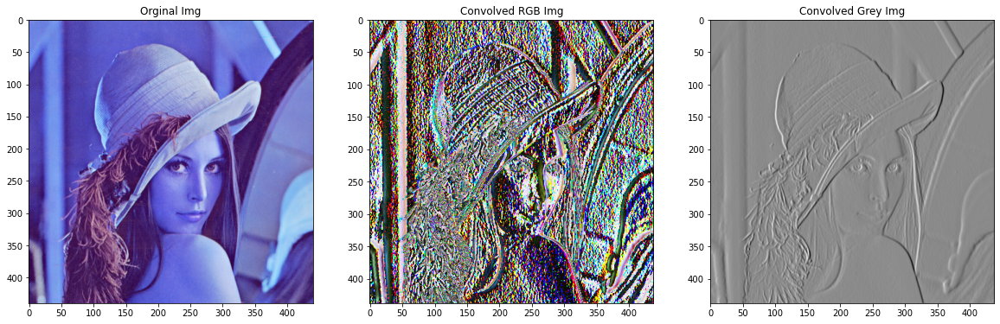

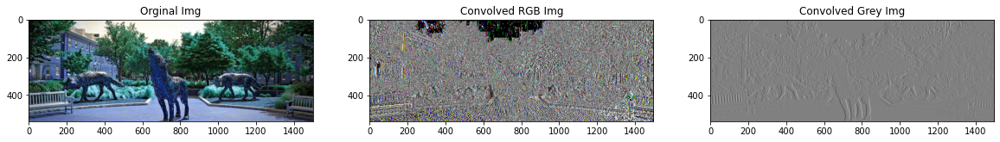

In [10]:
# convolution on 'Lena' coloredImage
use_filter = prewitt_x.copy()
convImg_c = conv2(coloredImgLena, use_filter)
convImg_g = conv2(greyImgLena, use_filter)
display_images(coloredImgLena, convImg_c, convImg_g, title=titleName, flag=1)

# convolution on 'Wolve' coloredImage
convImg_c = conv2(coloredImgWolve, use_filter)
convImg_g = conv2(greyImgWolve, use_filter)
display_images(coloredImgWolve, convImg_c, convImg_g, title=titleName, flag=1)

### Colored Image vs. Gray Image [prewitt_y ]

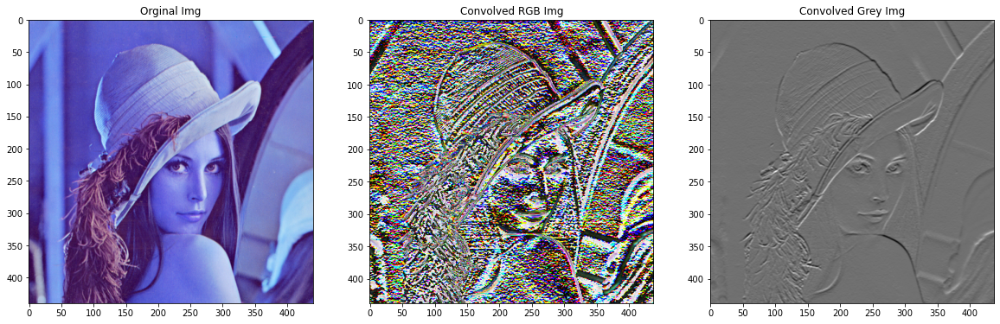

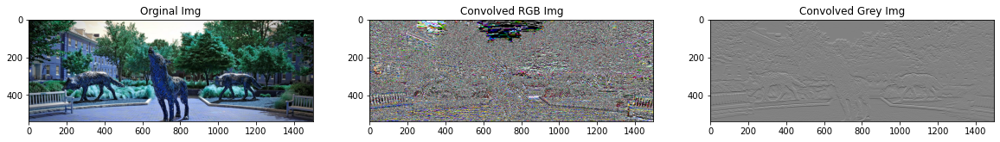

In [11]:
# convolution on 'Lena' coloredImage
use_filter = prewitt_y.copy()
convImg_c = conv2(coloredImgLena, use_filter)
convImg_g = conv2(greyImgLena, use_filter)
display_images(coloredImgLena, convImg_c, convImg_g, title=titleName, flag=1)

# convolution on 'Wolve' coloredImage
convImg_c = conv2(coloredImgWolve, use_filter)
convImg_g = conv2(greyImgWolve, use_filter)
display_images(coloredImgWolve, convImg_c, convImg_g, title=titleName, flag=1)

### Colored Image vs. Gray Image [roberts_x ]

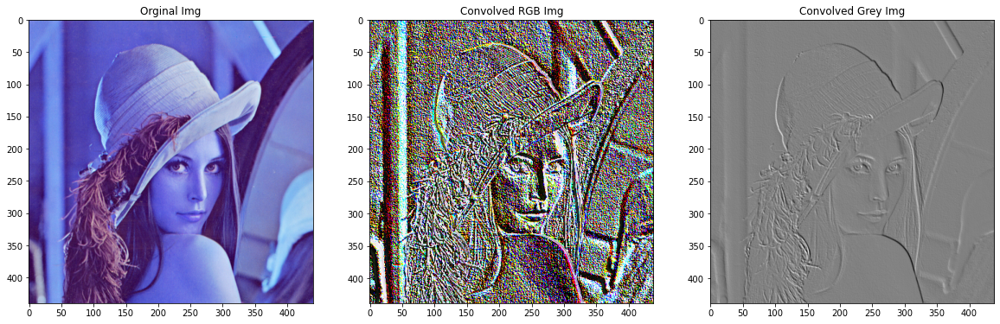

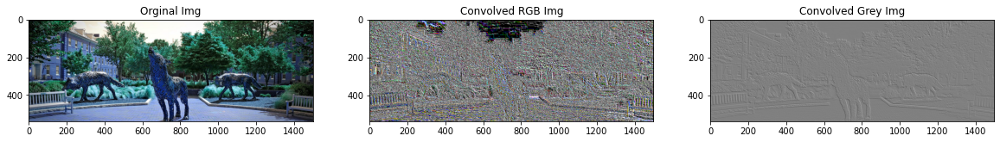

In [12]:
# convolution on 'Lena' coloredImage
use_filter = roberts_x.copy()
convImg_c = conv2(coloredImgLena, use_filter)
convImg_g = conv2(greyImgLena, use_filter)
display_images(coloredImgLena, convImg_c, convImg_g, title=titleName, flag=1)

# convolution on 'Wolve' coloredImage
convImg_c = conv2(coloredImgWolve, use_filter)
convImg_g = conv2(greyImgWolve, use_filter)
display_images(coloredImgWolve, convImg_c, convImg_g, title=titleName, flag=1)

### Colored Image vs. Gray Image [roberts_y ]

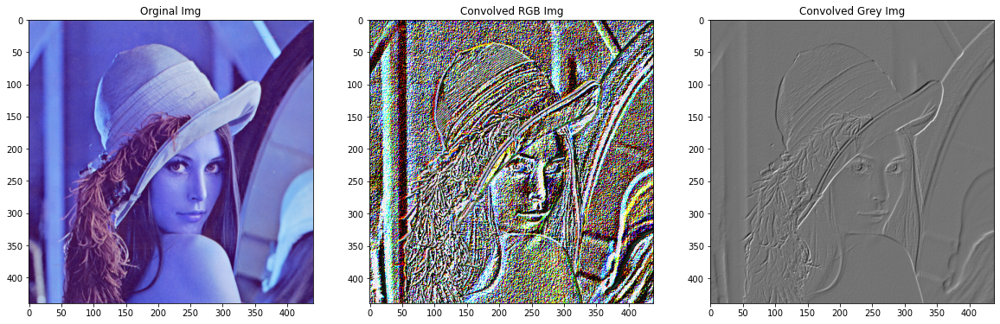

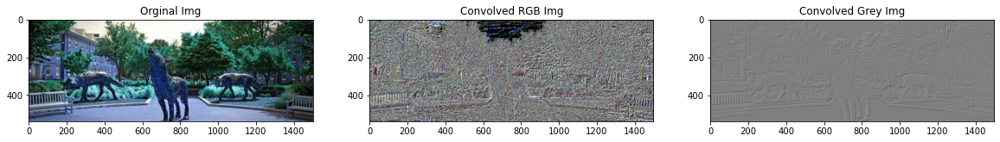

In [13]:
# convolution on 'Lena' coloredImage
use_filter = roberts_y.copy()
convImg_c = conv2(coloredImgLena, use_filter)
convImg_g = conv2(greyImgLena, use_filter)
display_images(coloredImgLena, convImg_c, convImg_g, title=titleName, flag=1)

# convolution on 'Wolve' coloredImage
convImg_c = conv2(coloredImgWolve, use_filter)
convImg_g = conv2(greyImgWolve, use_filter)
display_images(coloredImgWolve, convImg_c, convImg_g, title=titleName, flag=1)

### Colored Image vs. Gray Image [first derivative 1 ]

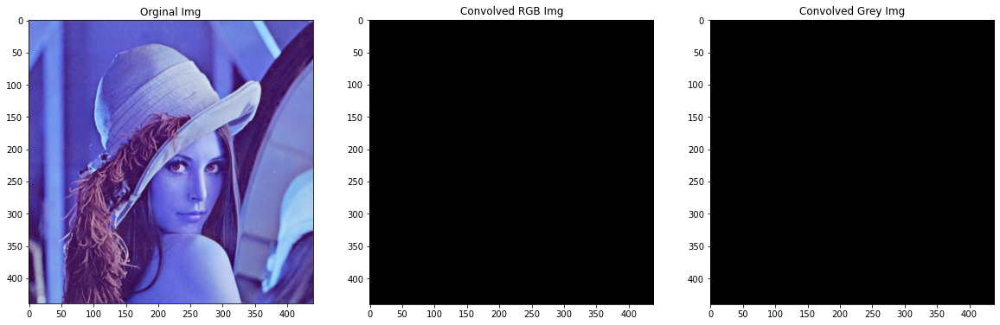

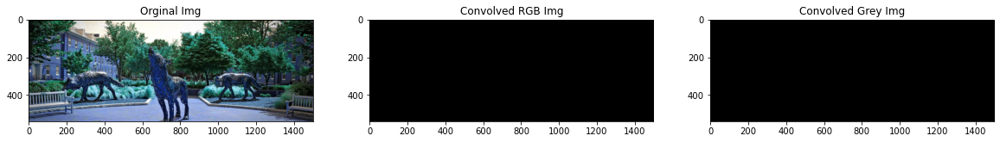

In [14]:
# convolution on 'Lena' coloredImage
use_filter = first_deriv_f1.copy()
convImg_c = conv2(coloredImgLena, use_filter)
convImg_g = conv2(greyImgLena, use_filter)
display_images(coloredImgLena, convImg_c, convImg_g, title=titleName, flag=1)

# convolution on 'Wolve' coloredImage
convImg_c = conv2(coloredImgWolve, use_filter)
convImg_g = conv2(greyImgWolve, use_filter)
display_images(coloredImgWolve, convImg_c, convImg_g, title=titleName, flag=1)

### Colored Image vs. Gray Image [first derivative 2 ]

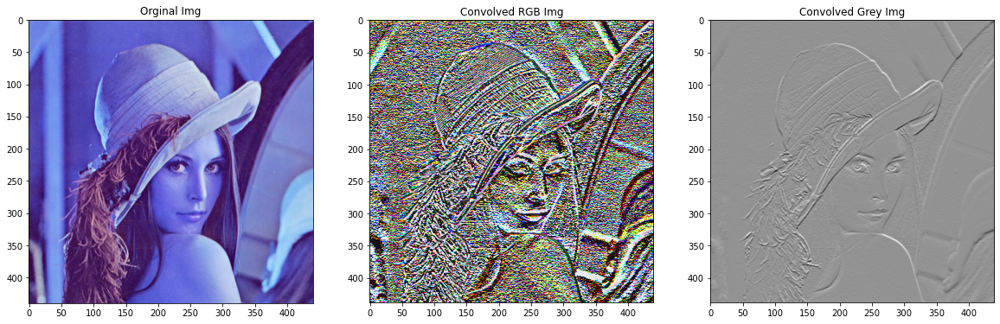

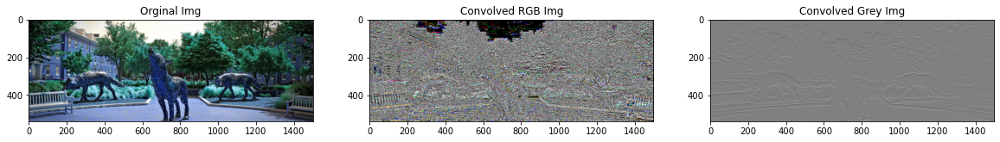

In [15]:
# convolution on 'Lena' coloredImage
use_filter = first_deriv_f2.copy()
convImg_c = conv2(coloredImgLena, use_filter)
convImg_g = conv2(greyImgLena, use_filter)
display_images(coloredImgLena, convImg_c, convImg_g, title=titleName, flag=1)

# convolution on 'Wolve' coloredImage
convImg_c = conv2(coloredImgWolve, use_filter)
convImg_g = conv2(greyImgWolve, use_filter)
display_images(coloredImgWolve, convImg_c, convImg_g, title=titleName, flag=1)

### Colored Image vs. Gray Image [box filter ]

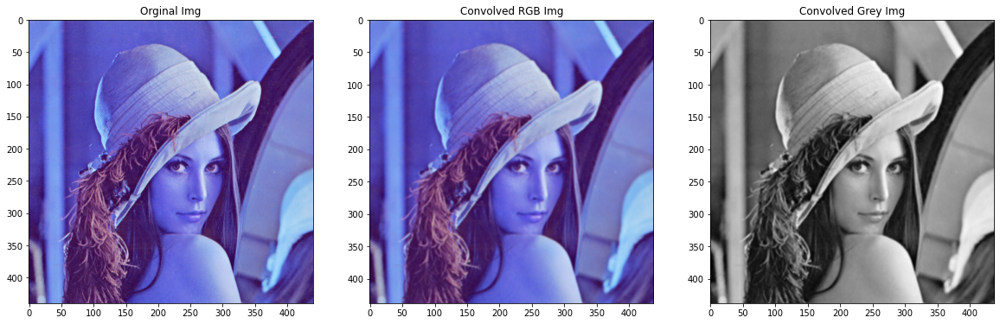

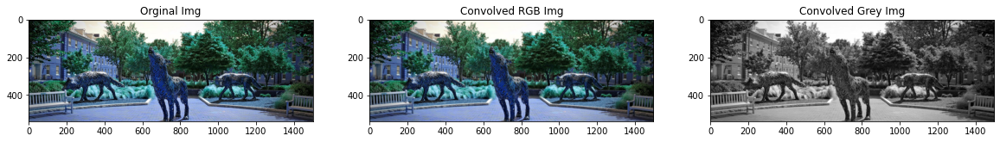

In [16]:
# convolution on 'Lena' coloredImage
use_filter = box.copy()
convImg_c = conv2(coloredImgLena, use_filter)
convImg_g = conv2(greyImgLena, use_filter)
display_images(coloredImgLena, convImg_c, convImg_g, title=titleName, flag=1)

# convolution on 'Wolve' coloredImage
convImg_c = conv2(coloredImgWolve, use_filter)
convImg_g = conv2(greyImgWolve, use_filter)
display_images(coloredImgWolve, convImg_c, convImg_g, title=titleName, flag=1)

## part - (b)

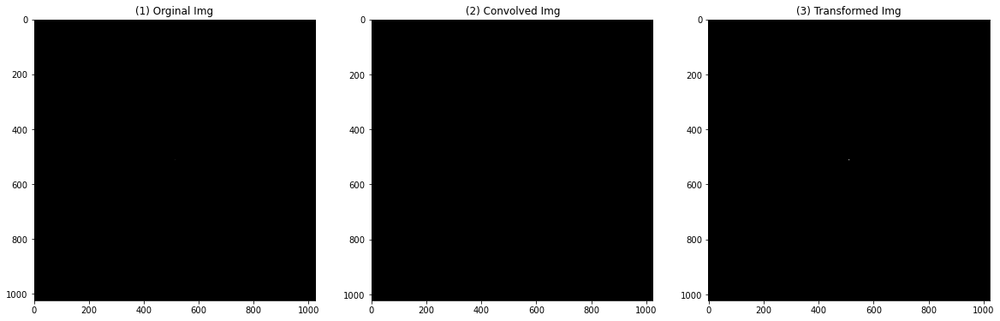

In [17]:
# grey image of size 1024x1024 pixels that consists of a unit
# impulse at the center of the image (512, 512)
customImg = signal.unit_impulse(shape=(1024,1024), idx='mid')

# convolving custom image with box_filter.
convolvedImg = conv2(customImg.copy(), box)

# Replacing 0.1111 values with 255 to clearly see convolution impact
transformedImg = convolvedImg.copy()
transformedImg[transformedImg > 0] = 255

titleName = ['(1) Orginal Img',' (2) Convolved Img', '(3) Transformed Img']
display_images(customImg, convolvedImg, transformedImg, title=titleName, flag=1)

In [18]:
# validating convolution
convolvedImg[509:514, 509:514] # note convolution has worked well

array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.11111111, 0.11111111, 0.11111111, 0.        ],
       [0.        , 0.11111111, 0.11111111, 0.11111111, 0.        ],
       [0.        , 0.11111111, 0.11111111, 0.11111111, 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])

In [19]:
transformedImg[509:514, 509:514]

array([[  0.,   0.,   0.,   0.,   0.],
       [  0., 255., 255., 255.,   0.],
       [  0., 255., 255., 255.,   0.],
       [  0., 255., 255., 255.,   0.],
       [  0.,   0.,   0.,   0.,   0.]])

###### Explaination:  The convolution function is working well as it can be seen in the convolvedImg. As expected, an unit impulse image is convolved with a box filter (3X3), a 3X3 region should be non-zero in the convolued Image. However, the resultant convolved image is displayed "black" because the majority of the pixels are 0 and a small portion (3X3) is equivalent to zero. Hence, the overall, image is black. Consequently, both 1st and 2nd images looks same. 
###### To show impact of convolution, 0.1111 values are replaced with 255 and the impact is shown in the 3rd subplot. As a result, a small white dot is seen in the image as highlighted in the below screenshot.
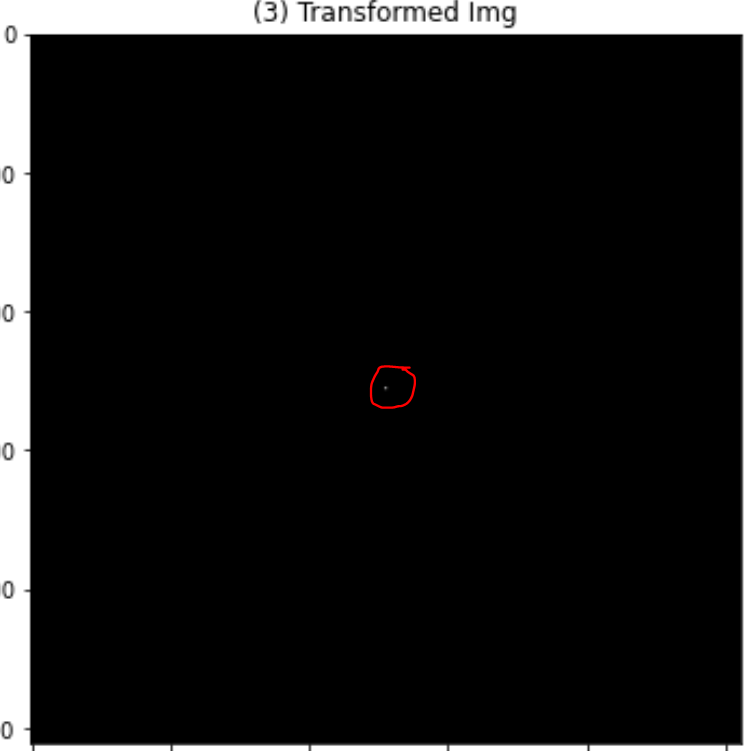
Hence, The convolution function is working well.

# Problem 2: DFT & IDFT

## part - (a)

####  Defining DFT function

In [20]:
## defining fourier transform function
def DFT(f):
    '''
    input, f: 2D image <2D nummy array>
    output, fft_mat: fourier transformed matrix <2D numpy array>
    '''
    # image dimension
    nrows = f.shape[0]
    ncols = f.shape[1]
    
    # counter variables
    m = np.arange(nrows)
    n = np.arange(ncols)
    x = m.reshape((nrows,1))
    y = n.reshape((ncols,1))
    
    # 2d numpy array holders
    fft_holder = np.zeros((nrows,ncols),complex)
    fft_mat = np.zeros((nrows,ncols),complex)
    
    for row in range(nrows):
        # real + imaginary
        M = np.cos(-2*np.pi*y*n/ncols) + 1j*np.sin(-2*np.pi*y*n/ncols) 
        fft_holder[row] = np.dot(M, f[row])
        
    for col in range(ncols):
        N = np.cos(-2*np.pi*x*m/ncols) + 1j*np.sin(-2*np.pi*x*m/ncols) 
        fft_mat[:,col] = np.dot(N, fft_holder[:,col])
        
    return fft_mat

####  Normalizing Images to [0,1]

In [21]:
normGreyImgLena = NormalizeData(greyImgLena)
normGreyImgWolve = NormalizeData(greyImgWolve)

####  Visualizing the spectrum and phase angle image

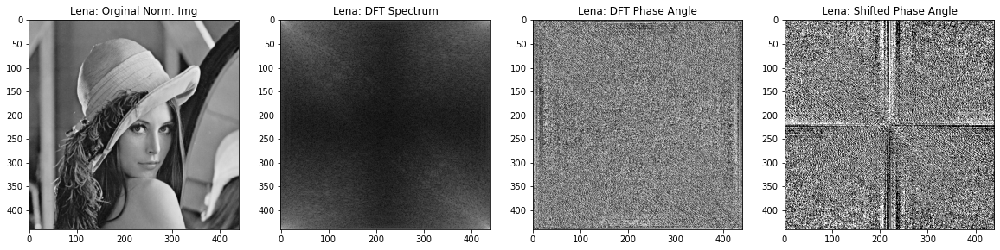

In [22]:
## FFT on 'Lena Image'
dftma_mat_l = DFT(normGreyImgLena)
dftma_Img_p = np.angle(dftma_mat_l)
dft_s_angle = np.fft.fftshift(dftma_Img_p)
dft_s_angle = np.arctan2(dft_s_angle.real, dft_s_angle.imag)
dftma_Img_l = np.log(1 + np.abs(dftma_mat_l)) # applying transform

titleName = ['Lena: Orginal Norm. Img','Lena: DFT Spectrum',
             'Lena: DFT Phase Angle',
             'Lena: Shifted Phase Angle']
display_images(normGreyImgLena, dftma_Img_l, dftma_Img_p,
               dft_s_angle, title=titleName, flag=3)

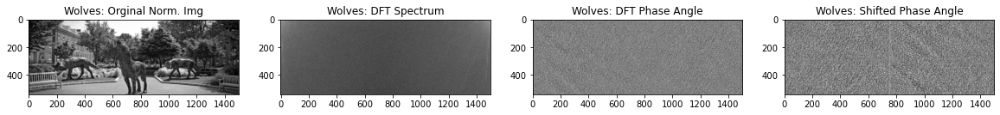

In [23]:
## FFT on 'Wolves Image'
dftma_mat_w = DFT(normGreyImgWolve.copy())
dftma_Img_p = np.angle(dftma_mat_w)
dft_s_angle = np.fft.fftshift(dftma_Img_p)
dft_s_angle = np.arctan2(dft_s_angle.real, dft_s_angle.imag)
dftma_Img_w = np.log(1 + np.abs(dftma_mat_w)) # applying transform

titleName = ['Wolves: Orginal Norm. Img',
             'Wolves: DFT Spectrum',
             'Wolves: DFT Phase Angle',
             'Wolves: Shifted Phase Angle']
display_images(normGreyImgWolve, dftma_Img_w, 
               dftma_Img_p, dft_s_angle, title=titleName, flag=3)

# part - (b)

####  Defining IDFT function

In [24]:
## defining inverse fourier transform function using 1D-IDFT
def IDFT2(F):
    # fft matrix dimension
    nrows = F.shape[0]
    ncols = F.shape[1]
    
    # ifft holders
    tmp_ifft_mat = np.zeros((nrows,ncols),complex)
    ifft_mat = np.zeros((nrows,ncols),complex)
    
    m = np.arange(nrows)
    n = np.arange(ncols)
    x = m.reshape((nrows,1))
    y = n.reshape((ncols,1))
    
    for row in range(0,nrows):
        M = 1j*np.sin(2*np.pi*y*n/ncols) + np.cos(2*np.pi*y*n/ncols)
        tmp_ifft_mat[row] =  (np.dot(M, F[row]))/ nrows
        
    for col in range(0,ncols):
        N = 1j*np.sin(2*np.pi*x*m/ncols) + np.cos(2*np.pi*x*m/ncols)
        ifft_mat[:,col] = (np.dot(N, tmp_ifft_mat[:,col]) ) / ncols
        
    return ifft_mat

#### Testing IDFT2:

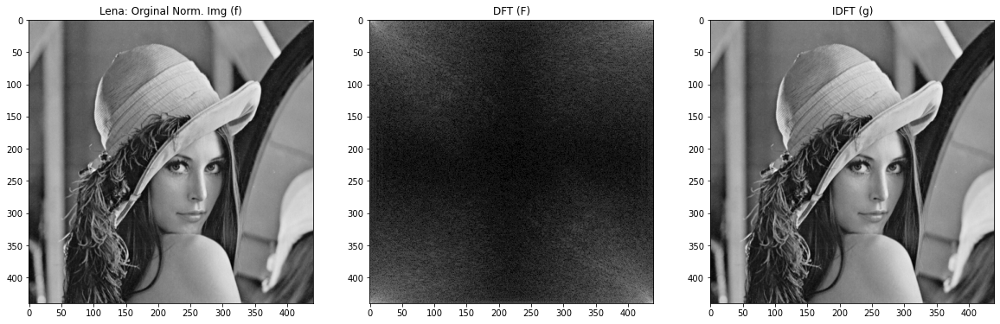

In [25]:
# call idft 
lena_f = normGreyImgLena.copy()
lena_F = DFT(lena_f)
lena_g = IDFT2(lena_F)

titleName = ['Lena: Orginal Norm. Img (f)','DFT (F)', 'IDFT (g)']
display_images(lena_f, np.log(1 + np.abs(lena_F)),
               lena_g.real, title=titleName, flag=1)

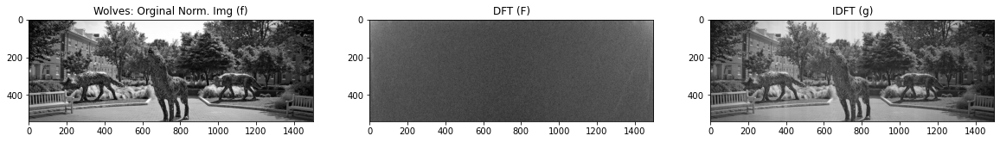

In [26]:
# call idft 
wolves_f = normGreyImgWolve.copy()
wolves_F = DFT(wolves_f)
wolves_g = IDFT2(wolves_F)

titleName = ['Wolves: Orginal Norm. Img (f)','DFT (F)', 'IDFT (g)']
display_images(wolves_f, np.log(1 + np.abs(wolves_F)),
               wolves_g.real, title=titleName, flag=1)